In [ ]:
import pandas as pd
import numpy as np
import  seaborn as sns
import plotly.express as px
import matplotlib.pyplot  as  plt
from sklearn.preprocessing import OneHotEncoder,MinMaxScaler,LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error

In [ ]:
clean_df = pd.read_csv('Clean_Dataset.csv')

In [ ]:
# EDA

In [ ]:
# Price Analysis
fig = px.histogram(data_frame=clean_df,
                   x ='price',
                   nbins=20,marginal='box',
                   color_discrete_sequence=['#6c3483'],
                   text_auto=True,title='The Distribution of Flight Price')
fig.update_layout()
fig.show()

In [ ]:
fig = px.histogram(data_frame=clean_df,
                   x ='price',
                   nbins=20,marginal='box',
                   color='class',
                   text_auto=True,title='The Distribution of Flight Price vs Class')
fig.update_layout()
fig.show()

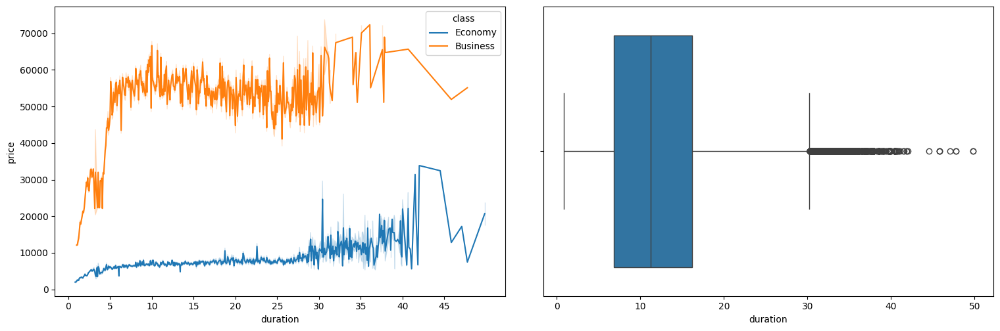

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plt.tight_layout()
# Left ax
sns.lineplot(x='duration', y='price', data=clean_df, ax=ax[0], hue='class').set_xticks(np.arange(0, 50, 5))
# Right AX
sns.boxplot(data=clean_df, x='duration', ax=ax[1])
plt.show()

<Axes: xlabel='airline', ylabel='price'>

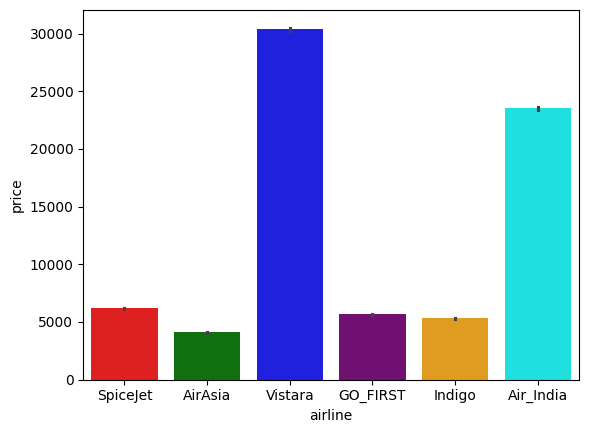

In [ ]:
# Airline ticket price
colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan']
sns.barplot(data=clean_df, x='airline', y='price', hue='airline', dodge=False, palette=colors, legend=False)

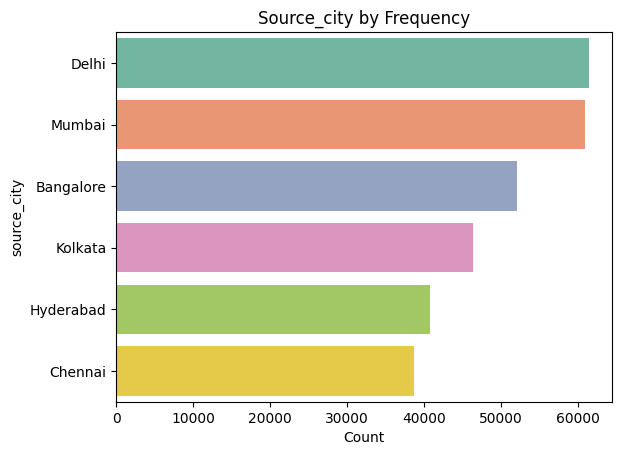

In [ ]:
# Source City
import seaborn as sns
import matplotlib.pyplot as plt

# Use a different color for each source_city
source_count =clean_df.source_city.value_counts().reset_index(name='Count')
colors = sns.color_palette("Set2", n_colors=len(source_count))  # Use the Set2 palette to assign colors by number of categories
sns.barplot(data=source_count, x='Count', y='source_city', hue='source_city', palette=colors, legend=False)

plt.title("Source_city by Frequency")
plt.show()

Text(0.5, 1.0, 'Destination_city by Frequency')

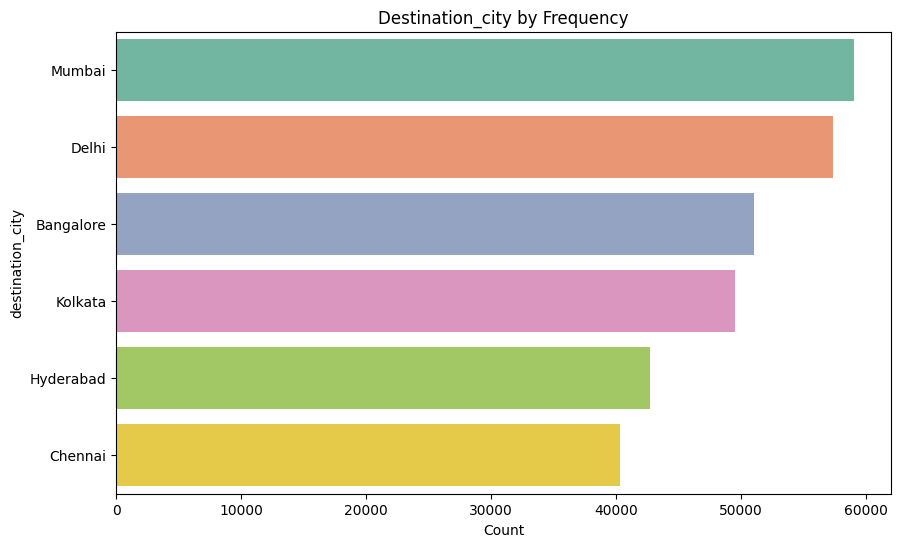

In [ ]:
# Destination City
import seaborn as sns
import matplotlib.pyplot as plt

city_count =clean_df.destination_city.value_counts().reset_index(name='Count')
plt.figure(figsize=(10,6))
# Use a different color for each source_city
colors = sns.color_palette("Set2", n_colors=len(source_count))  # Use the Set2 palette to assign colors by number of categories
sns.barplot(data=city_count,y='destination_city',x='Count', hue='destination_city', palette=colors, legend=False)
plt.title("Destination_city by Frequency")

In [ ]:
# Days left vs Price based on Source city
fig = px.scatter(data_frame=clean_df,
                 x='days_left',
                 y='price',
                 color='source_city',
                 title='Days left vs Price based on Source city'
                )
fig.show()

In [ ]:
# Days left vs Price based on Destination_city
fig = px.scatter(data_frame=clean_df,
                 x='days_left',
                 y='price',
                 color='destination_city',
                 title='Days left vs Price based on Destination_city'
                )
fig.show()

<ipython-input-14-d37b3a43dffc>:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-14-d37b3a43dffc>:20: UserWarning:


The palette list has fewer values (5) than needed (6) and will cycle, which may produce an uninterpretable plot.



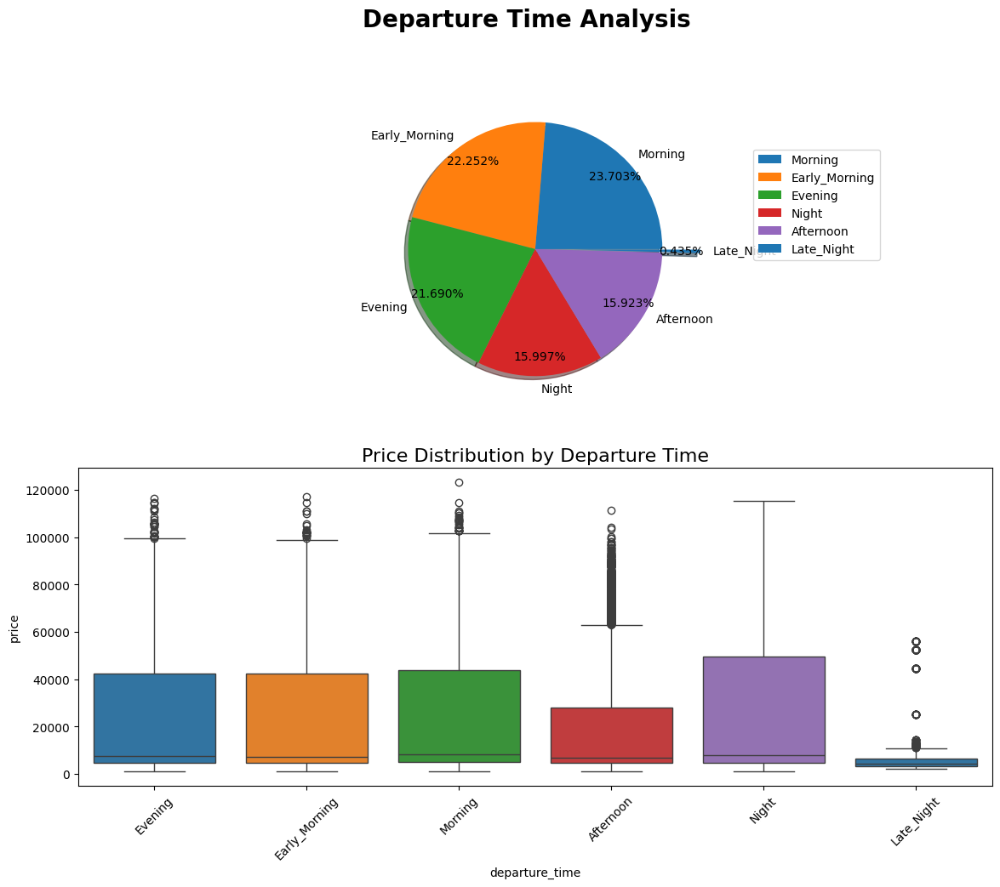

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the figure size
fig, ax = plt.subplots(2, 1, figsize=(12, 10))  # Increased size for better visibility
fig.suptitle('Departure Time Analysis', fontsize=20, fontweight='bold')
plt.tight_layout(pad=3.0)  # Adjust padding for better layout

# Top ax - Pie Chart
labels = clean_df.departure_time.value_counts().index.tolist()
sizes = clean_df.departure_time.value_counts()
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']  # Define colors for segments
explode = (0, 0, 0, 0, 0, 0.3)  # Only explode the last slice

ax[0].pie(sizes, autopct='%.3f%%', labels=labels, shadow=True,
          pctdistance=0.85, explode=explode, colors=colors)
ax[0].legend(bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=5)

# Bottom ax - Boxplot
sns.boxplot(x='departure_time', y='price', data=clean_df, ax=ax[1], palette=colors)
ax[1].set_title('Price Distribution by Departure Time', fontsize=16)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.show()

<ipython-input-15-91102831e56c>:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




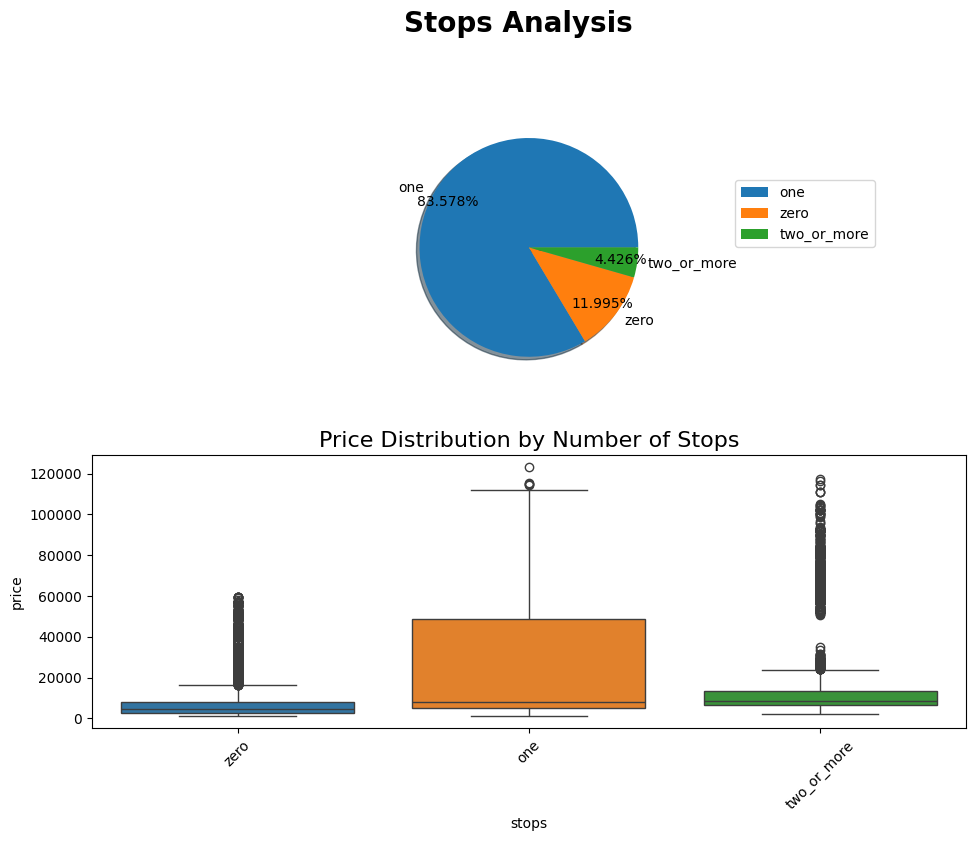

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the figure size
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle('Stops Analysis', fontsize=20, fontweight='bold')
plt.tight_layout(pad=3.0)  # Adjust padding for better layout

# Top ax - Pie Chart
labels = clean_df.stops.value_counts().index.tolist()
sizes = clean_df.stops.value_counts()
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Assign specific colors to categories

ax[0].pie(sizes, autopct='%.3f%%', labels=labels, shadow=True, pctdistance=0.85, colors=colors)
ax[0].legend(bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=5)

# Bottom ax - Boxplot
sns.boxplot(x='stops', y='price', data=clean_df, ax=ax[1], palette=colors)
ax[1].set_title('Price Distribution by Number of Stops', fontsize=16)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.show()

<ipython-input-16-07d479957b1e>:19: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




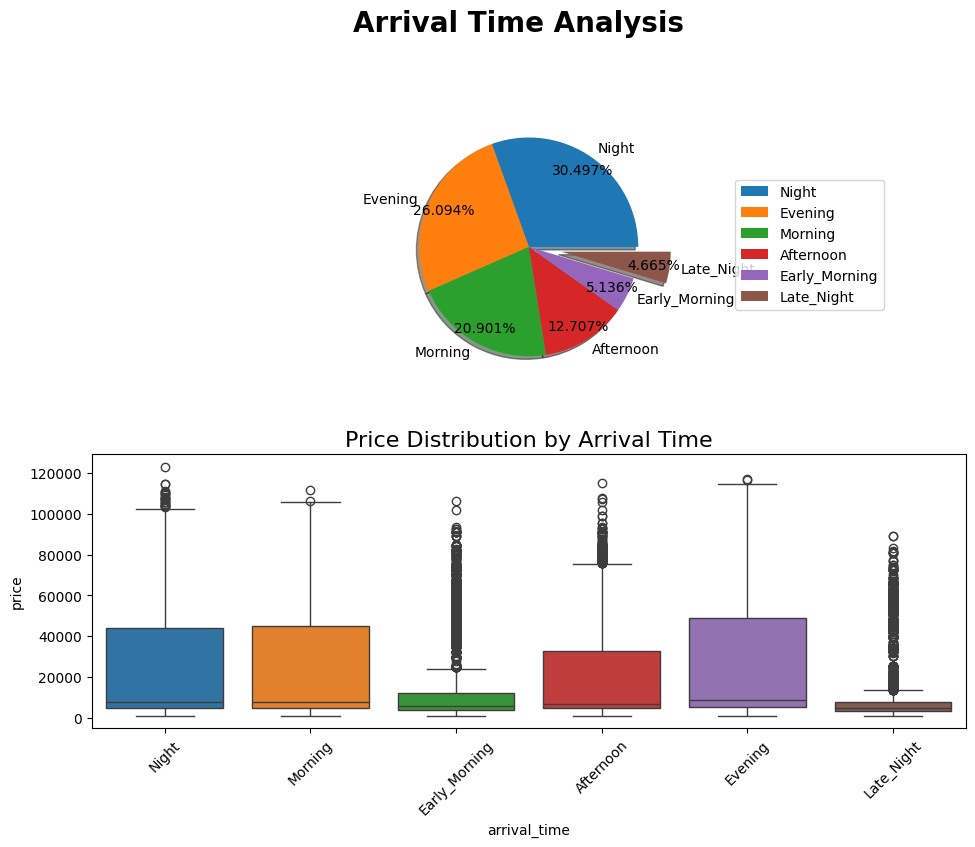

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the figure size
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle('Arrival Time Analysis', fontsize=20, fontweight='bold')
plt.tight_layout(pad=3.0)  # Adjust padding for better layout

# Top ax - Pie Chart
labels = clean_df.arrival_time.value_counts().index.tolist()
sizes = clean_df.arrival_time.value_counts()
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']  # Define colors for segments

ax[0].pie(sizes, autopct='%.3f%%', labels=labels, shadow=True,
          pctdistance=0.85, explode=(0, 0, 0, 0, 0, 0.3), colors=colors)
ax[0].legend(bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=5)

# Bottom ax - Boxplot
sns.boxplot(x='arrival_time', y='price', data=clean_df, ax=ax[1], palette=colors)
ax[1].set_title('Price Distribution by Arrival Time', fontsize=16)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

plt.show()

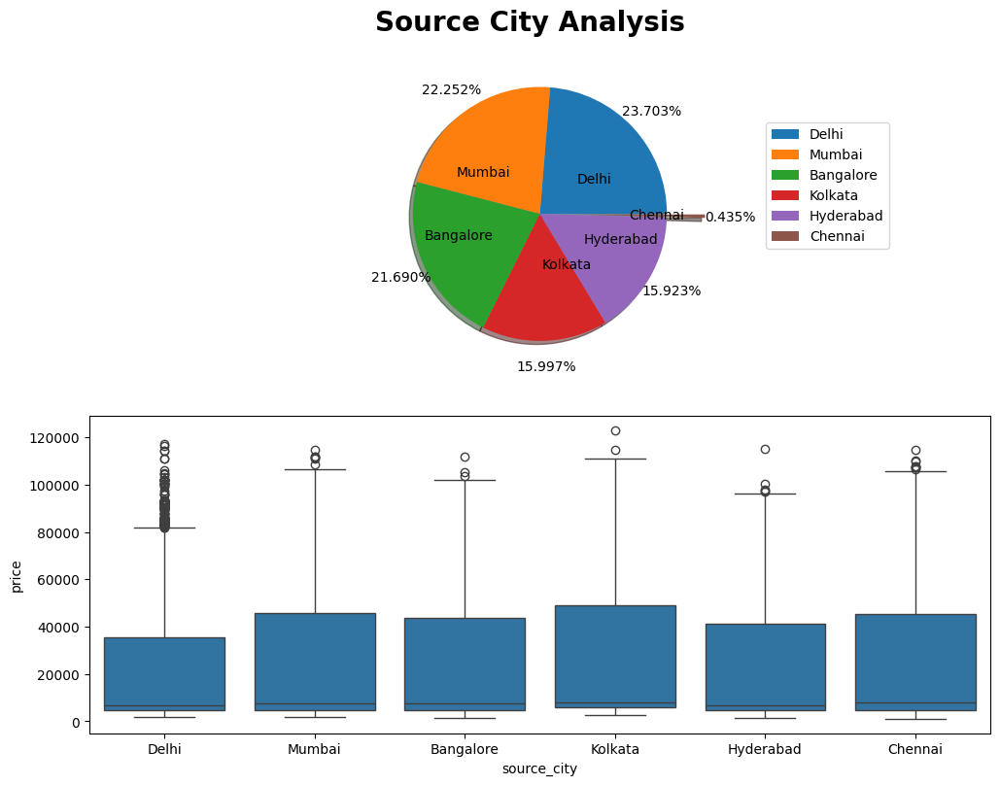

In [ ]:
# Source City Analysis
fig, ax = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle('Source City Analysis', fontsize=20, fontweight='bold')
plt.tight_layout()
# Top ax
labels = clean_df.source_city.value_counts().index.tolist()
explode = (0, 0, 0, 0, 0, 0.3)
ax[0].pie(clean_df.departure_time.value_counts(), autopct='%.3f%%', labels=labels, shadow=True, pctdistance=1.2, labeldistance=0.4, explode=explode)
ax[0].legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=5)

# Bottom ax
sns.boxplot(x='source_city', y='price', data=clean_df, ax=ax[1])
plt.show()

In [ ]:
# EDA end

In [ ]:
# Data Preprocessing
# remove the outlier
clean_df = clean_df[clean_df.price <=100000]
inputs_cols=['airline',  'source_city', 'departure_time','stops', 'arrival_time',
            'destination_city', 'class', 'duration','days_left', ]
targets_col='price'
inputs_dataset = clean_df[inputs_cols].copy()
targets_set    = clean_df[targets_col].copy()
numeric_cols = inputs_dataset.select_dtypes(include=np.number).columns.tolist()
categorical_cols = inputs_dataset.select_dtypes(include='object').columns.tolist()
numeric_cols

['duration', 'days_left']

In [ ]:
# Scaling
scaler = MinMaxScaler()
scaler.fit(inputs_dataset[numeric_cols])
inputs_dataset[numeric_cols] = scaler.transform(inputs_dataset[numeric_cols])
inputs_dataset[numeric_cols] =inputs_dataset[numeric_cols].astype('float32')

In [ ]:
# Encoding
encoder = OneHotEncoder(sparse_output=False,handle_unknown='ignore')
encoder.fit(inputs_dataset[categorical_cols])
encoder_cols = encoder.get_feature_names_out(categorical_cols)
inputs_dataset[encoder_cols]=encoder.transform(inputs_dataset[categorical_cols])
inputs_dataset[encoder_cols] = inputs_dataset[encoder_cols].astype('float32')

In [ ]:
# Model

In [ ]:
# Model Train and prediction data preparation
X = np.array(pd.concat([inputs_dataset[numeric_cols], inputs_dataset[encoder_cols]],axis=1))
y = np.array(targets_set,dtype=np.float32)

# Initial division into training set and temporary set
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)

# Split validation and test sets from the temporary set
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Output the division ratio to ensure the correct division
print(f"Train set: {X_train.shape}, Validation set: {X_val.shape}, Test set: {X_test.shape}")

Train set: (240036, 37), Validation set: (30004, 37), Test set: (30005, 37)


In [ ]:
# Train Logistic Regression
from sklearn.linear_model import LinearRegression

lr_model= LinearRegression()
lr_model.fit(X_train,y_train)

LinearRegression()

In [ ]:
# Random forest takes 3 minutes, please wait
# Train random forest
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
# Train XGBoost model
from xgboost import XGBRegressor

xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)

/Users/wanjunxiao/myenv/lib/python3.9/site-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBRegressor or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


AttributeError: 'super' object has no attribute '__sklearn_tags__'

AttributeError: 'super' object has no attribute '__sklearn_tags__'

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
# Train Grad_boost
from sklearn.ensemble import GradientBoostingRegressor

gbr_model = GradientBoostingRegressor(random_state=42)
gbr_model.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Define a function to evaluate the model
def evaluate_model(model, X_train, y_train, X_val, y_val, model_name):

    # Make predictions on the validation set
    y_pred = model.predict(X_val)

    # Calculating evaluation metrics
    mse = mean_squared_error(y_val, y_pred)  # Mean square error
    rmse = np.sqrt(mse)                     # Root mean square error
    mae = mean_absolute_error(y_val, y_pred)  # Mean absolute error
    r2 = r2_score(y_val, y_pred)            # Coefficient of determination R²

    # Output evaluation results
    print(f"{model_name} Model Evaluation:")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"R² Score: {r2:.4f}")
    print("-" * 50)

# Model Evaluation
print("Evaluating models on validation set:")
evaluate_model(lr_model, X_train, y_train, X_val, y_val, "Linear Regression")
evaluate_model(rf_model, X_train, y_train, X_val, y_val, "Random Forest Regressor")
evaluate_model(xgb_model, X_train, y_train, X_val, y_val, "XGBoost Regressor")
evaluate_model(gbr_model, X_train, y_train, X_val, y_val, "Gradient Boosting Regressor")

Evaluating models on validation set:
Linear Regression Model Evaluation:
Mean Squared Error (MSE): 45561576.0000
Root Mean Squared Error (RMSE): 6749.9316
Mean Absolute Error (MAE): 4569.1670
R² Score: 0.9122
--------------------------------------------------
Random Forest Regressor Model Evaluation:
Mean Squared Error (MSE): 7376484.3333
Root Mean Squared Error (RMSE): 2715.9684
Mean Absolute Error (MAE): 1048.1837
R² Score: 0.9858
--------------------------------------------------
XGBoost Regressor Model Evaluation:
Mean Squared Error (MSE): 11347964.0000
Root Mean Squared Error (RMSE): 3368.6739
Mean Absolute Error (MAE): 1922.2745
R² Score: 0.9781
--------------------------------------------------
Gradient Boosting Regressor Model Evaluation:
Mean Squared Error (MSE): 24279902.8636
Root Mean Squared Error (RMSE): 4927.4641
Mean Absolute Error (MAE): 2932.4495
R² Score: 0.9532
--------------------------------------------------


In [ ]:
# Next to Result Interperation

<h2>Model Evaluation Results</h3>  

<table style="font-size: 18px; width: 100%;">  
    <tr>  
        <th>Model</th>  
        <th>Mean Squared Error (MSE)</th>  
        <th>Root Mean Squared Error (RMSE)</th>  
        <th>Mean Absolute Error (MAE)</th>  
        <th>R² Score</th>  
    </tr>  
    <tr>  
        <td>Linear Regression</td>  
        <td>45561576.0000</td>  
        <td>6749.9316</td>  
        <td>4569.1670</td>  
        <td>0.9122</td>  
    </tr>  
    <tr>  
        <td>Random Forest Regressor</td>  
        <td>7376484.3333</td>  
        <td>2715.9684</td>  
        <td>1048.1837</td>  
        <td>0.9858</td>  
    </tr>  
    <tr>  
        <td>XGBoost Regressor</td>  
        <td>11347964.0000</td>  
        <td>3368.6739</td>  
        <td>1922.2745</td>  
        <td>0.9781</td>  
    </tr>  
    <tr>  
        <td>Gradient Boosting</td>  
        <td>24279902.8636</td>  
        <td>4927.4641</td>  
        <td>2932.4495</td>  
        <td>0.9532</td>  
    </tr>  
</table>

## Analysis Summary  

### Random Forest Regressor:  
- **R² Score (0.9858):** This is the highest among all models, indicating that it explains approximately 98.58% of the variance in the data. This suggests an excellent fit.  
- **Mean Absolute Error (MAE) (1048.1837):** This is the lowest, indicating it has the smallest average prediction error compared to the actual values.  
- **Root Mean Squared Error (RMSE) (2715.9684):** Also the lowest among the models, reinforcing its superior predictive accuracy.  

### XGBoost Regressor:  
- **R² Score (0.9781):** A strong score, indicating it also explains a significant portion of the variance.  
- **MAE (1922.2745)** and **RMSE (3368.6739)** are higher than those of the Random Forest Regressor, suggesting it is slightly less accurate in predictions.  

### Gradient Boosting:  
- **R² Score (0.9532):** This shows it explains less variation compared to the first two models.  
- **MAE** and **RMSE** indicate a moderate predictive accuracy.  

### Linear Regression:  
- This model has the lowest performance, with the highest **MSE (45561576.0000)**, **RMSE (6749.9316)**, and **MAE (4569.1670)**.  
- The **R² Score (0.9122)** indicates it is significantly less effective in explaining the variance.  

## Conclusion  
The **Random Forest Regressor** is the best model, showing the highest **R² Score (0.9858)** and the lowest **MSE**, **RMSE**, and **MAE**. It provides the most accurate predictions, making it the optimal choice for this dataset.

In [ ]:
# Deployment

In [ ]:
import joblib
joblib.dump(scaler, 'scaler.pkl')  # Saving MinMaxScaler
joblib.dump(encoder, 'encoder.pkl')  # Saving OneHotEncoder
joblib.dump(rf_model, 'rf_model.pkl')  # Saving Model Objects

In [ ]:
from flask import Flask, request, render_template
import pandas as pd
import numpy as np
import joblib

# Initializing the Flask application
app = Flask(__name__)

# Loading saved models and preprocessors
rf_model = joblib.load('rf_model.pkl')
scaler = joblib.load('scaler.pkl')
encoder = joblib.load('encoder.pkl')

# Defining numeric and categorical columns
numeric_cols = ['duration', 'days_left']
categorical_cols = ['airline', 'source_city', 'departure_time', 'stops', 'arrival_time', 'destination_city', 'class']

# 1 INR = 0.012 USD
INR_TO_USD_RATE = 0.012

# Data preprocessing functions
def preprocess_data(input_data):
    # Convert to DataFrame format
    df = pd.DataFrame([input_data])

    # Numerical feature normalization
    df[numeric_cols] = scaler.transform(df[numeric_cols])

    # One-hot encoding of categorical features
    encoder_cols = encoder.get_feature_names_out(categorical_cols)
    encoded_features = encoder.transform(df[categorical_cols])
    encoded_df = pd.DataFrame(encoded_features, columns=encoder_cols)

    # Merging numerical and encoded categorical features
    final_df = pd.concat([df[numeric_cols].reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)
    return np.array(final_df)

@app.route('/')
def home():
    return render_template('index.html', predicted_price=None, error=None, user_input=None)

@app.route('/predict', methods=['POST'])
def predict():
    try:
        # Get form data
        user_input = {
            'airline': request.form['airline'],
            'source_city': request.form['source_city'],
            'destination_city': request.form['destination_city'],
            'departure_time': request.form['departure_time'],
            'arrival_time': request.form['arrival_time'],
            'stops': request.form['stops'],
            'class': request.form['class'],
            # Keep the input hour directly without conversion
            'duration': float(request.form['duration']),  # Direct storage of hours
            'days_left': int(request.form['days_left']),
        }

        # Data preprocessing
        processed_data = preprocess_data(user_input)

        # Predicted Price (in INR)
        predicted_price_inr = rf_model.predict(processed_data)[0]

        # Convert to US Dollar (USD)
        predicted_price_usd = predicted_price_inr * INR_TO_USD_RATE

        return render_template(
            'index.html',
            predicted_price=round(predicted_price_usd, 2),
            error=None,
            user_input=user_input
        )

    except Exception as e:
        return render_template(
            'index.html',
            predicted_price=None,
            error=str(e),
            user_input=request.form
        )

if __name__ == '__main__':
    app.run(debug=True, port=5001)